# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [61]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

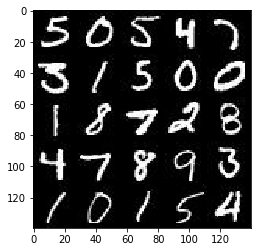

In [62]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

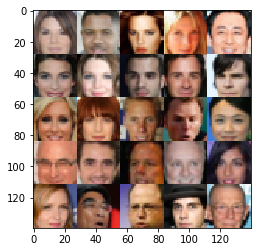

In [63]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [64]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.4.0
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [65]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels])
    z = tf.placeholder(tf.float32, [None, z_dim])
    lr = tf.placeholder(tf.float32)
    
    return real, z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [66]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        alpha = 0.2
        # Input layer is 28x28x3
        
        conv_layer = tf.layers.conv2d(images,64, 5, strides=(2,2), padding='SAME', use_bias=True)
        conv_layer = tf.maximum(alpha * conv_layer, conv_layer)
        # Now 14*14*64
        
        conv_layer = tf.layers.conv2d(conv_layer, 128, 5, strides=(2,2), padding='SAME', use_bias=False)
        conv_layer = tf.layers.batch_normalization(conv_layer, training=True)
        conv_layer = tf.maximum(alpha * conv_layer, conv_layer)
        #Now 7*7*128
        
        conv_layer = tf.layers.conv2d(conv_layer, 256, 5, strides=(2,2), padding='SAME', use_bias=False)
        conv_layer = tf.layers.batch_normalization(conv_layer, training=True)
        conv_layer = tf.maximum(alpha * conv_layer, conv_layer)        
        #Now 4*4*256
        
        flat = tf.reshape(conv_layer, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [67]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=not(is_train)):
        alpha = 0.2
        
        # Input layer - Dense Layer
        x = tf.layers.dense(z, 3*3*512, use_bias=True, activation=None)
        x = tf.reshape(x, (-1, 3, 3, 512))
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)

        #4*4*256
        strides=1
        conv_layer = tf.layers.conv2d_transpose(x, 256, 2, strides, 'valid', use_bias=False, activation=None)
        conv_layer = tf.layers.batch_normalization(conv_layer, training=is_train)
        conv_layer = tf.maximum(alpha * conv_layer, conv_layer)
        
        #7*7*128
        strides=1
        conv_layer = tf.layers.conv2d_transpose(conv_layer, 128, 4, strides, 'valid', use_bias=False, activation=None)
        conv_layer = tf.layers.batch_normalization(conv_layer, training=is_train)
        conv_layer = tf.maximum(alpha * conv_layer, conv_layer)
   
        #14*14*64
        strides=2
        conv_layer = tf.layers.conv2d_transpose(conv_layer, 64,5, strides, 'same', use_bias=False, activation=None)
        conv_layer = tf.layers.batch_normalization(conv_layer, training=is_train)
        conv_layer = tf.maximum(alpha * conv_layer, conv_layer)
        
        #Conv Layer - 28,28,3 
        logits = tf.layers.conv2d_transpose(conv_layer, out_channel_dim,5, strides, 'same', use_bias=True, activation=None)
        
        # Logits and tanh output
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [68]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_l_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_l_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_l_real + d_l_fake

    return d_loss, g_loss
    

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [69]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [70]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [71]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    import numpy as np
    show= 50
    print_=10

    input_real, input_z, lr = model_inputs(data_shape[1],data_shape[2],data_shape[3], z_dim)

    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
        
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    iterations=0
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                
                batch_images = batch_images * 2
                
                # TODO: Train Model
                # Sample random noise
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images,lr:learning_rate})
                
                #show_generator_output(sess, 1, input_z, data_shape[3], data_image_mode)
                
                if iterations % print_ ==0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))                
                iterations+=1
                if iterations % show == 0:
                    show_generator_output(sess, 58, input_z, data_shape[3], data_image_mode)
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
        print("Final : Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))                
        show_generator_output(sess, 58, input_z, data_shape[3], data_image_mode)                
 

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 27.6909... Generator Loss: 0.0000
Epoch 1/2... Discriminator Loss: 0.5910... Generator Loss: 14.2327
Epoch 1/2... Discriminator Loss: 2.1224... Generator Loss: 0.1402
Epoch 1/2... Discriminator Loss: 0.2123... Generator Loss: 1.9957
Epoch 1/2... Discriminator Loss: 3.0785... Generator Loss: 0.0816


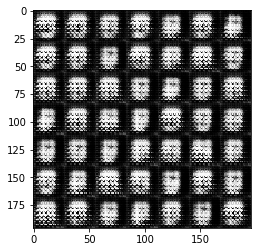

Epoch 1/2... Discriminator Loss: 2.0166... Generator Loss: 2.1045
Epoch 1/2... Discriminator Loss: 0.7658... Generator Loss: 0.9134
Epoch 1/2... Discriminator Loss: 0.5460... Generator Loss: 2.1640
Epoch 1/2... Discriminator Loss: 1.4538... Generator Loss: 0.5194
Epoch 1/2... Discriminator Loss: 2.3080... Generator Loss: 3.9714


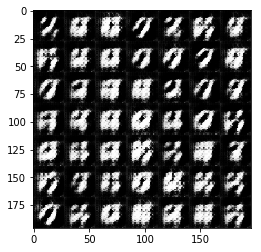

Epoch 1/2... Discriminator Loss: 1.2587... Generator Loss: 2.3321
Epoch 1/2... Discriminator Loss: 1.5857... Generator Loss: 2.8995
Epoch 1/2... Discriminator Loss: 1.2128... Generator Loss: 2.0273
Epoch 1/2... Discriminator Loss: 1.5680... Generator Loss: 0.3296
Epoch 1/2... Discriminator Loss: 1.4830... Generator Loss: 0.3974


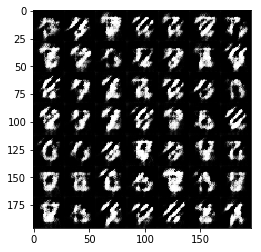

Epoch 1/2... Discriminator Loss: 1.0165... Generator Loss: 0.8334
Epoch 1/2... Discriminator Loss: 1.2864... Generator Loss: 0.6534
Epoch 1/2... Discriminator Loss: 1.6426... Generator Loss: 0.3370
Epoch 1/2... Discriminator Loss: 1.2189... Generator Loss: 0.5853
Epoch 1/2... Discriminator Loss: 1.5627... Generator Loss: 0.3670


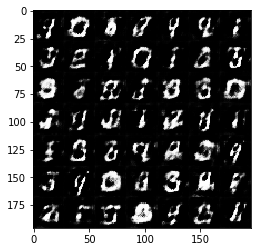

Epoch 1/2... Discriminator Loss: 1.7312... Generator Loss: 0.2922
Epoch 1/2... Discriminator Loss: 1.4724... Generator Loss: 0.4128
Epoch 1/2... Discriminator Loss: 1.8522... Generator Loss: 2.0519
Epoch 1/2... Discriminator Loss: 1.1816... Generator Loss: 1.2715
Epoch 1/2... Discriminator Loss: 1.0841... Generator Loss: 1.6397


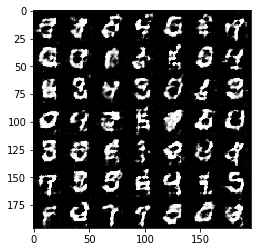

Epoch 1/2... Discriminator Loss: 1.2279... Generator Loss: 1.4428
Epoch 1/2... Discriminator Loss: 1.3791... Generator Loss: 1.5373
Epoch 1/2... Discriminator Loss: 1.5446... Generator Loss: 1.7187
Epoch 1/2... Discriminator Loss: 1.5095... Generator Loss: 1.7311
Epoch 1/2... Discriminator Loss: 1.2286... Generator Loss: 1.2248


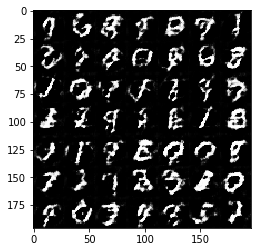

Epoch 1/2... Discriminator Loss: 1.6019... Generator Loss: 1.8229
Epoch 1/2... Discriminator Loss: 1.2271... Generator Loss: 1.1329
Epoch 1/2... Discriminator Loss: 1.3783... Generator Loss: 1.2704
Epoch 1/2... Discriminator Loss: 1.3922... Generator Loss: 1.3991
Epoch 1/2... Discriminator Loss: 1.2912... Generator Loss: 1.5012


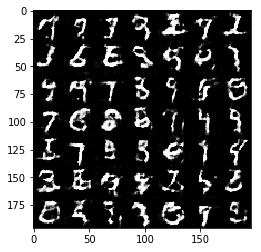

Epoch 1/2... Discriminator Loss: 1.2465... Generator Loss: 1.3464
Epoch 1/2... Discriminator Loss: 1.2586... Generator Loss: 1.1396
Epoch 1/2... Discriminator Loss: 1.2549... Generator Loss: 0.7796
Epoch 1/2... Discriminator Loss: 1.2779... Generator Loss: 1.0758
Epoch 1/2... Discriminator Loss: 1.2667... Generator Loss: 0.9610


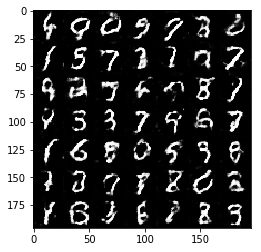

Epoch 1/2... Discriminator Loss: 1.4680... Generator Loss: 1.1642
Epoch 1/2... Discriminator Loss: 1.3536... Generator Loss: 1.2230
Epoch 1/2... Discriminator Loss: 1.3578... Generator Loss: 1.3092
Epoch 1/2... Discriminator Loss: 1.3353... Generator Loss: 1.1944
Epoch 1/2... Discriminator Loss: 1.3830... Generator Loss: 1.2742


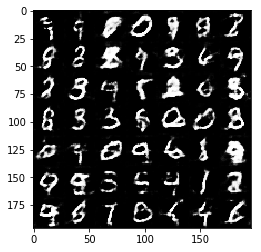

Epoch 1/2... Discriminator Loss: 1.4338... Generator Loss: 1.3372
Epoch 1/2... Discriminator Loss: 1.2911... Generator Loss: 0.7540
Epoch 2/2... Discriminator Loss: 1.2875... Generator Loss: 0.4724
Epoch 2/2... Discriminator Loss: 1.2413... Generator Loss: 0.5161
Epoch 2/2... Discriminator Loss: 1.6604... Generator Loss: 0.3011


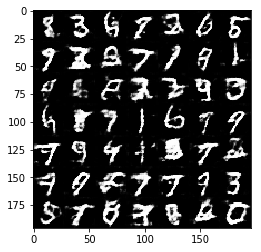

Epoch 2/2... Discriminator Loss: 1.4205... Generator Loss: 0.4107
Epoch 2/2... Discriminator Loss: 1.4897... Generator Loss: 0.3510
Epoch 2/2... Discriminator Loss: 1.2063... Generator Loss: 0.6186
Epoch 2/2... Discriminator Loss: 1.4105... Generator Loss: 0.3851
Epoch 2/2... Discriminator Loss: 1.2327... Generator Loss: 0.5490


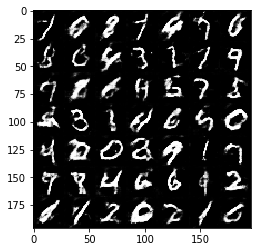

Epoch 2/2... Discriminator Loss: 1.3683... Generator Loss: 0.4171
Epoch 2/2... Discriminator Loss: 1.3008... Generator Loss: 0.4984
Epoch 2/2... Discriminator Loss: 1.3447... Generator Loss: 0.4419
Epoch 2/2... Discriminator Loss: 1.2473... Generator Loss: 0.6917
Epoch 2/2... Discriminator Loss: 1.6751... Generator Loss: 2.0465


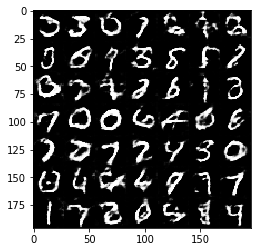

Epoch 2/2... Discriminator Loss: 1.2980... Generator Loss: 0.6582
Epoch 2/2... Discriminator Loss: 1.2756... Generator Loss: 1.0035
Epoch 2/2... Discriminator Loss: 1.6467... Generator Loss: 1.7319
Epoch 2/2... Discriminator Loss: 1.1564... Generator Loss: 0.7778
Epoch 2/2... Discriminator Loss: 1.5310... Generator Loss: 0.3333


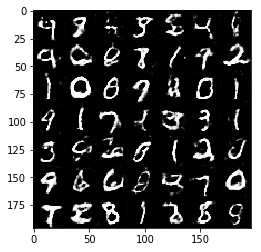

Epoch 2/2... Discriminator Loss: 1.3332... Generator Loss: 0.5595
Epoch 2/2... Discriminator Loss: 1.6757... Generator Loss: 0.2892
Epoch 2/2... Discriminator Loss: 1.2550... Generator Loss: 0.5269
Epoch 2/2... Discriminator Loss: 1.2751... Generator Loss: 1.3726
Epoch 2/2... Discriminator Loss: 1.8038... Generator Loss: 2.1388


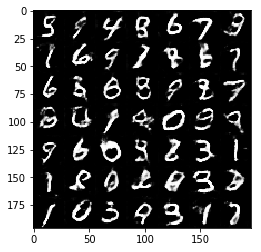

Epoch 2/2... Discriminator Loss: 1.1275... Generator Loss: 0.9903
Epoch 2/2... Discriminator Loss: 1.4136... Generator Loss: 1.6229
Epoch 2/2... Discriminator Loss: 1.3156... Generator Loss: 1.4871
Epoch 2/2... Discriminator Loss: 1.1575... Generator Loss: 0.8856
Epoch 2/2... Discriminator Loss: 1.8056... Generator Loss: 1.9554


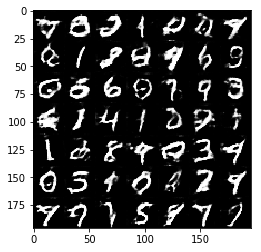

Epoch 2/2... Discriminator Loss: 1.2690... Generator Loss: 1.5435
Epoch 2/2... Discriminator Loss: 1.2642... Generator Loss: 1.3222
Epoch 2/2... Discriminator Loss: 1.5716... Generator Loss: 1.5429
Epoch 2/2... Discriminator Loss: 1.2478... Generator Loss: 0.7256
Epoch 2/2... Discriminator Loss: 1.3826... Generator Loss: 0.4615


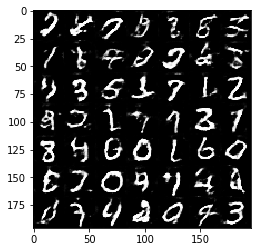

Epoch 2/2... Discriminator Loss: 1.4541... Generator Loss: 0.4051
Epoch 2/2... Discriminator Loss: 1.2422... Generator Loss: 0.6604
Epoch 2/2... Discriminator Loss: 1.6714... Generator Loss: 1.7785
Epoch 2/2... Discriminator Loss: 1.2571... Generator Loss: 0.7450
Epoch 2/2... Discriminator Loss: 1.9204... Generator Loss: 0.2156


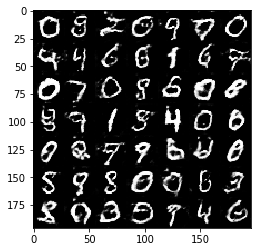

Epoch 2/2... Discriminator Loss: 1.1477... Generator Loss: 0.8024
Epoch 2/2... Discriminator Loss: 1.4294... Generator Loss: 1.8500
Epoch 2/2... Discriminator Loss: 1.2940... Generator Loss: 0.5390
Epoch 2/2... Discriminator Loss: 1.2197... Generator Loss: 0.6184
Epoch 2/2... Discriminator Loss: 1.3425... Generator Loss: 0.4573


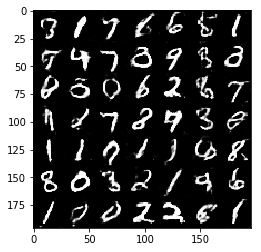

Epoch 2/2... Discriminator Loss: 1.4401... Generator Loss: 0.4399
Epoch 2/2... Discriminator Loss: 1.1477... Generator Loss: 0.6975
Epoch 2/2... Discriminator Loss: 2.1279... Generator Loss: 0.1644
Epoch 2/2... Discriminator Loss: 1.2483... Generator Loss: 0.6153
Final : Discriminator Loss: 1.2483... Generator Loss: 0.6153


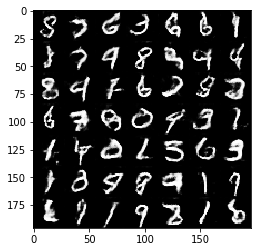

In [72]:
batch_size = 128
z_dim = 100
learning_rate = 0.002 
beta1 = 0.3 


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 13.5800... Generator Loss: 0.0000
Epoch 1/1... Discriminator Loss: 2.8508... Generator Loss: 11.9933
Epoch 1/1... Discriminator Loss: 0.6776... Generator Loss: 0.9158
Epoch 1/1... Discriminator Loss: 2.3931... Generator Loss: 3.0209
Epoch 1/1... Discriminator Loss: 1.6681... Generator Loss: 1.5855


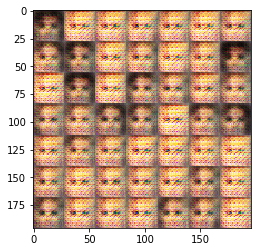

Epoch 1/1... Discriminator Loss: 1.2934... Generator Loss: 1.3167
Epoch 1/1... Discriminator Loss: 1.5117... Generator Loss: 0.9810
Epoch 1/1... Discriminator Loss: 1.1690... Generator Loss: 0.7455
Epoch 1/1... Discriminator Loss: 1.3129... Generator Loss: 1.4267
Epoch 1/1... Discriminator Loss: 1.6160... Generator Loss: 0.4691


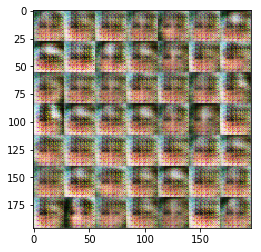

Epoch 1/1... Discriminator Loss: 1.3838... Generator Loss: 0.8698
Epoch 1/1... Discriminator Loss: 1.4644... Generator Loss: 0.6169
Epoch 1/1... Discriminator Loss: 1.5107... Generator Loss: 0.4654
Epoch 1/1... Discriminator Loss: 1.2929... Generator Loss: 0.8352
Epoch 1/1... Discriminator Loss: 1.5526... Generator Loss: 1.0774


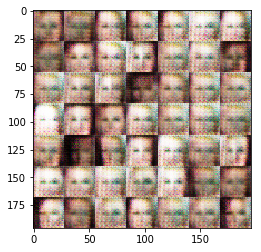

Epoch 1/1... Discriminator Loss: 1.4499... Generator Loss: 0.7173
Epoch 1/1... Discriminator Loss: 1.3731... Generator Loss: 0.7282
Epoch 1/1... Discriminator Loss: 1.5655... Generator Loss: 0.4578
Epoch 1/1... Discriminator Loss: 1.3674... Generator Loss: 0.5830
Epoch 1/1... Discriminator Loss: 1.3357... Generator Loss: 0.8160


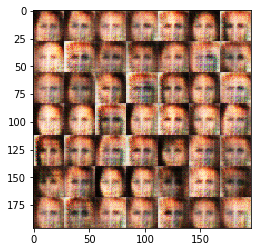

Epoch 1/1... Discriminator Loss: 1.3983... Generator Loss: 1.2028
Epoch 1/1... Discriminator Loss: 1.7409... Generator Loss: 1.3442
Epoch 1/1... Discriminator Loss: 1.5469... Generator Loss: 0.8203
Epoch 1/1... Discriminator Loss: 1.6328... Generator Loss: 0.5801
Epoch 1/1... Discriminator Loss: 1.5195... Generator Loss: 0.6731


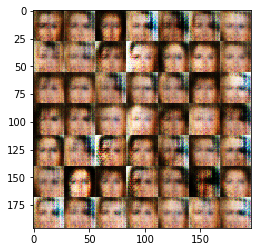

Epoch 1/1... Discriminator Loss: 1.6708... Generator Loss: 1.1685
Epoch 1/1... Discriminator Loss: 1.3625... Generator Loss: 0.9001
Epoch 1/1... Discriminator Loss: 1.6214... Generator Loss: 0.3190
Epoch 1/1... Discriminator Loss: 1.4706... Generator Loss: 0.4900
Epoch 1/1... Discriminator Loss: 1.4384... Generator Loss: 0.9566


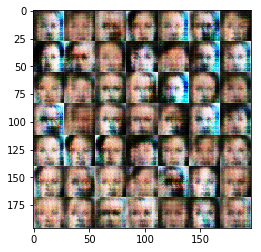

Epoch 1/1... Discriminator Loss: 1.3516... Generator Loss: 1.0178
Epoch 1/1... Discriminator Loss: 1.4003... Generator Loss: 0.6774
Epoch 1/1... Discriminator Loss: 1.4902... Generator Loss: 0.5990
Epoch 1/1... Discriminator Loss: 1.7062... Generator Loss: 1.4346
Epoch 1/1... Discriminator Loss: 1.2924... Generator Loss: 1.0361


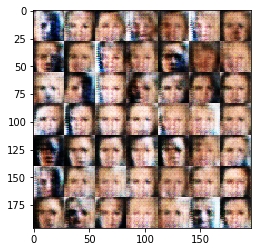

Epoch 1/1... Discriminator Loss: 1.3638... Generator Loss: 1.0103
Epoch 1/1... Discriminator Loss: 1.4096... Generator Loss: 0.9183
Epoch 1/1... Discriminator Loss: 1.5231... Generator Loss: 1.1112
Epoch 1/1... Discriminator Loss: 1.4234... Generator Loss: 0.8536
Epoch 1/1... Discriminator Loss: 1.5408... Generator Loss: 0.8553


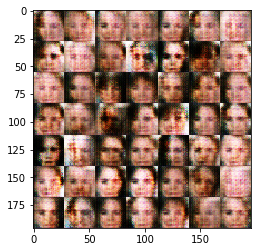

Epoch 1/1... Discriminator Loss: 1.3399... Generator Loss: 0.6923
Epoch 1/1... Discriminator Loss: 1.5499... Generator Loss: 0.4416
Epoch 1/1... Discriminator Loss: 1.3670... Generator Loss: 0.6194
Epoch 1/1... Discriminator Loss: 1.3743... Generator Loss: 0.7852
Epoch 1/1... Discriminator Loss: 1.4038... Generator Loss: 0.5361


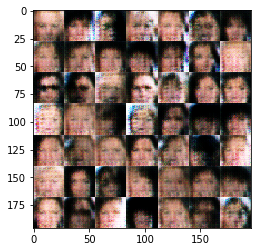

Epoch 1/1... Discriminator Loss: 1.2289... Generator Loss: 0.9010
Epoch 1/1... Discriminator Loss: 1.3882... Generator Loss: 0.7622
Epoch 1/1... Discriminator Loss: 1.5139... Generator Loss: 0.8915
Epoch 1/1... Discriminator Loss: 1.5094... Generator Loss: 0.8377
Epoch 1/1... Discriminator Loss: 1.3998... Generator Loss: 0.7822


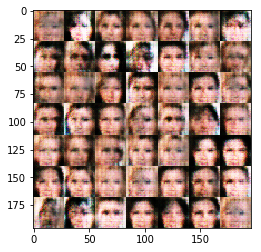

Epoch 1/1... Discriminator Loss: 1.6552... Generator Loss: 0.3696
Epoch 1/1... Discriminator Loss: 1.6055... Generator Loss: 0.3306
Epoch 1/1... Discriminator Loss: 1.4337... Generator Loss: 0.4672
Epoch 1/1... Discriminator Loss: 1.4691... Generator Loss: 0.7457
Epoch 1/1... Discriminator Loss: 1.3926... Generator Loss: 0.7638


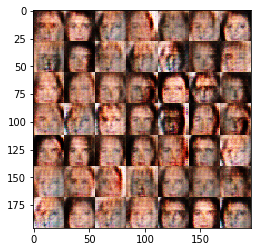

Epoch 1/1... Discriminator Loss: 1.3830... Generator Loss: 0.7266
Epoch 1/1... Discriminator Loss: 1.4223... Generator Loss: 0.7914
Epoch 1/1... Discriminator Loss: 1.3435... Generator Loss: 0.8120
Epoch 1/1... Discriminator Loss: 1.4537... Generator Loss: 0.5156
Epoch 1/1... Discriminator Loss: 1.2926... Generator Loss: 0.8960


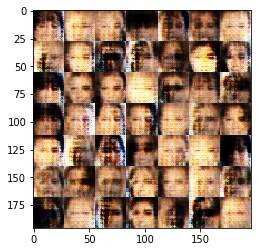

Epoch 1/1... Discriminator Loss: 1.7306... Generator Loss: 0.3011
Epoch 1/1... Discriminator Loss: 1.4703... Generator Loss: 0.3803
Epoch 1/1... Discriminator Loss: 1.6873... Generator Loss: 0.2928
Epoch 1/1... Discriminator Loss: 1.4135... Generator Loss: 0.5801
Epoch 1/1... Discriminator Loss: 1.1744... Generator Loss: 0.6931


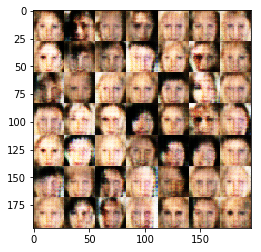

Epoch 1/1... Discriminator Loss: 1.5220... Generator Loss: 0.6144
Epoch 1/1... Discriminator Loss: 1.6009... Generator Loss: 0.6908
Epoch 1/1... Discriminator Loss: 1.4036... Generator Loss: 0.8940
Epoch 1/1... Discriminator Loss: 1.4579... Generator Loss: 0.6715
Epoch 1/1... Discriminator Loss: 1.4028... Generator Loss: 0.6376


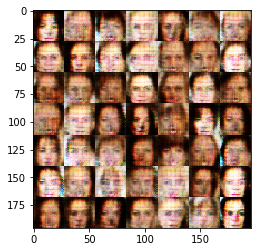

Epoch 1/1... Discriminator Loss: 1.3857... Generator Loss: 0.7391
Epoch 1/1... Discriminator Loss: 1.4513... Generator Loss: 0.7078
Epoch 1/1... Discriminator Loss: 1.3580... Generator Loss: 0.6609
Epoch 1/1... Discriminator Loss: 1.3260... Generator Loss: 0.6358
Epoch 1/1... Discriminator Loss: 1.4139... Generator Loss: 0.7274


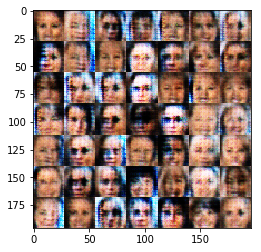

Epoch 1/1... Discriminator Loss: 1.3836... Generator Loss: 0.7274
Epoch 1/1... Discriminator Loss: 1.4310... Generator Loss: 0.5565
Epoch 1/1... Discriminator Loss: 1.3760... Generator Loss: 0.7059
Epoch 1/1... Discriminator Loss: 1.3970... Generator Loss: 0.7138
Epoch 1/1... Discriminator Loss: 1.3397... Generator Loss: 0.7185


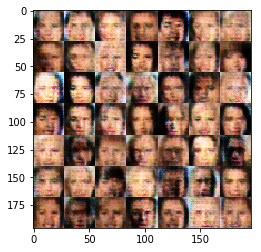

Epoch 1/1... Discriminator Loss: 1.3748... Generator Loss: 0.6416
Epoch 1/1... Discriminator Loss: 1.3826... Generator Loss: 0.7012
Epoch 1/1... Discriminator Loss: 1.4013... Generator Loss: 0.7073
Epoch 1/1... Discriminator Loss: 1.3902... Generator Loss: 0.6094
Epoch 1/1... Discriminator Loss: 1.3778... Generator Loss: 0.8759


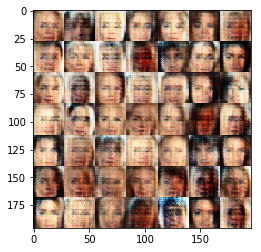

Epoch 1/1... Discriminator Loss: 1.4237... Generator Loss: 0.5512
Epoch 1/1... Discriminator Loss: 1.6242... Generator Loss: 0.3369
Epoch 1/1... Discriminator Loss: 1.3361... Generator Loss: 0.6890
Epoch 1/1... Discriminator Loss: 1.4298... Generator Loss: 0.4779
Epoch 1/1... Discriminator Loss: 1.6475... Generator Loss: 0.3335


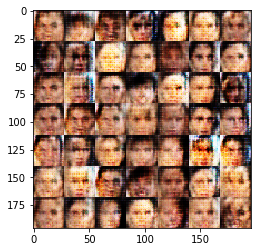

Epoch 1/1... Discriminator Loss: 1.2711... Generator Loss: 0.7316
Epoch 1/1... Discriminator Loss: 1.4385... Generator Loss: 0.5851
Epoch 1/1... Discriminator Loss: 1.2934... Generator Loss: 0.7413
Epoch 1/1... Discriminator Loss: 1.4897... Generator Loss: 0.5170
Epoch 1/1... Discriminator Loss: 1.2639... Generator Loss: 0.4854


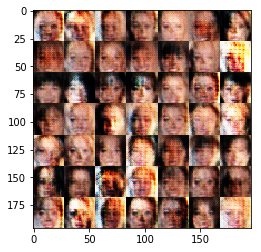

Epoch 1/1... Discriminator Loss: 1.2232... Generator Loss: 0.5204
Epoch 1/1... Discriminator Loss: 1.5193... Generator Loss: 0.7564
Epoch 1/1... Discriminator Loss: 1.3238... Generator Loss: 0.7258
Epoch 1/1... Discriminator Loss: 1.3357... Generator Loss: 0.5951
Epoch 1/1... Discriminator Loss: 1.1926... Generator Loss: 0.8275


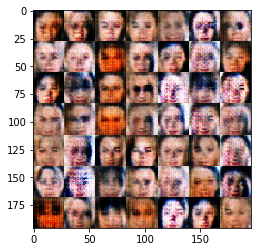

Epoch 1/1... Discriminator Loss: 1.2814... Generator Loss: 0.8064
Epoch 1/1... Discriminator Loss: 1.3199... Generator Loss: 0.6681
Epoch 1/1... Discriminator Loss: 1.4418... Generator Loss: 0.4781
Epoch 1/1... Discriminator Loss: 1.7178... Generator Loss: 0.3071
Epoch 1/1... Discriminator Loss: 1.4350... Generator Loss: 0.5062


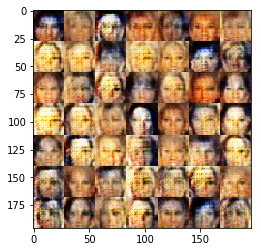

Epoch 1/1... Discriminator Loss: 1.1879... Generator Loss: 0.6748
Epoch 1/1... Discriminator Loss: 1.6333... Generator Loss: 0.3979
Epoch 1/1... Discriminator Loss: 1.4577... Generator Loss: 0.7230
Epoch 1/1... Discriminator Loss: 1.3534... Generator Loss: 0.7286
Epoch 1/1... Discriminator Loss: 1.2721... Generator Loss: 0.8169


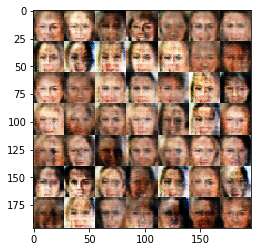

Epoch 1/1... Discriminator Loss: 1.1643... Generator Loss: 0.7971
Epoch 1/1... Discriminator Loss: 1.3392... Generator Loss: 1.2534
Epoch 1/1... Discriminator Loss: 1.4251... Generator Loss: 0.3987
Epoch 1/1... Discriminator Loss: 1.3988... Generator Loss: 0.4908
Epoch 1/1... Discriminator Loss: 1.5005... Generator Loss: 1.2963


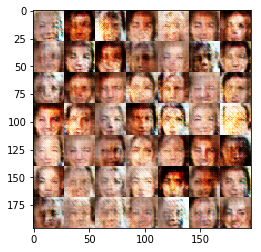

Epoch 1/1... Discriminator Loss: 1.4380... Generator Loss: 1.0580
Epoch 1/1... Discriminator Loss: 1.1917... Generator Loss: 0.6695
Epoch 1/1... Discriminator Loss: 1.2765... Generator Loss: 0.9315
Epoch 1/1... Discriminator Loss: 1.4169... Generator Loss: 0.5152
Epoch 1/1... Discriminator Loss: 1.3923... Generator Loss: 0.7323


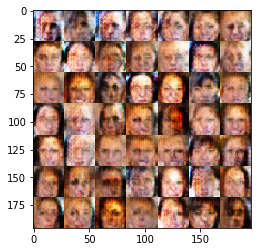

Epoch 1/1... Discriminator Loss: 1.4098... Generator Loss: 0.6712
Epoch 1/1... Discriminator Loss: 1.2515... Generator Loss: 0.7721
Epoch 1/1... Discriminator Loss: 1.3064... Generator Loss: 0.5691
Epoch 1/1... Discriminator Loss: 1.1912... Generator Loss: 0.6636
Epoch 1/1... Discriminator Loss: 1.3981... Generator Loss: 0.7208


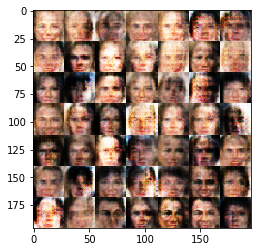

Epoch 1/1... Discriminator Loss: 1.5800... Generator Loss: 1.3982
Epoch 1/1... Discriminator Loss: 1.2862... Generator Loss: 0.6646
Epoch 1/1... Discriminator Loss: 1.2483... Generator Loss: 0.6796
Epoch 1/1... Discriminator Loss: 1.2670... Generator Loss: 0.6859
Epoch 1/1... Discriminator Loss: 1.1498... Generator Loss: 1.1801


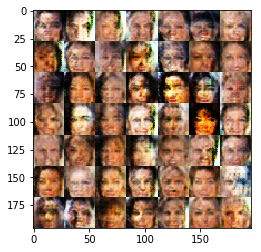

Epoch 1/1... Discriminator Loss: 1.2283... Generator Loss: 0.7353
Epoch 1/1... Discriminator Loss: 1.4343... Generator Loss: 0.7394
Epoch 1/1... Discriminator Loss: 1.1609... Generator Loss: 0.8326
Epoch 1/1... Discriminator Loss: 1.2757... Generator Loss: 0.6673
Epoch 1/1... Discriminator Loss: 1.3046... Generator Loss: 0.5240


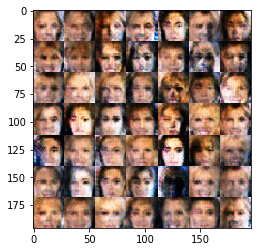

Epoch 1/1... Discriminator Loss: 1.2854... Generator Loss: 0.8811
Epoch 1/1... Discriminator Loss: 1.4062... Generator Loss: 0.6553
Epoch 1/1... Discriminator Loss: 1.3814... Generator Loss: 0.8738
Epoch 1/1... Discriminator Loss: 1.3133... Generator Loss: 0.7091
Epoch 1/1... Discriminator Loss: 1.2259... Generator Loss: 0.7479


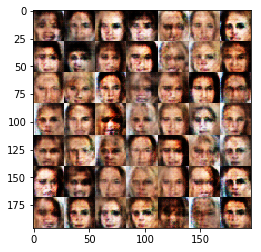

Epoch 1/1... Discriminator Loss: 1.4160... Generator Loss: 0.6417
Epoch 1/1... Discriminator Loss: 1.2719... Generator Loss: 0.7218
Epoch 1/1... Discriminator Loss: 1.3159... Generator Loss: 0.6152
Epoch 1/1... Discriminator Loss: 1.3119... Generator Loss: 0.6542
Epoch 1/1... Discriminator Loss: 1.4523... Generator Loss: 0.4322


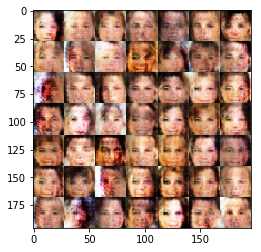

Epoch 1/1... Discriminator Loss: 1.3638... Generator Loss: 1.0526
Epoch 1/1... Discriminator Loss: 1.3156... Generator Loss: 0.8242
Epoch 1/1... Discriminator Loss: 1.3135... Generator Loss: 1.1871
Epoch 1/1... Discriminator Loss: 1.3890... Generator Loss: 0.7725
Epoch 1/1... Discriminator Loss: 1.2919... Generator Loss: 0.6725


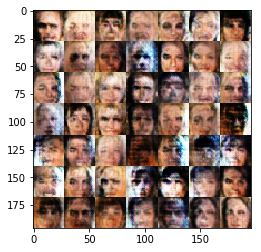

Epoch 1/1... Discriminator Loss: 1.6098... Generator Loss: 0.3090
Epoch 1/1... Discriminator Loss: 1.2179... Generator Loss: 0.8023
Epoch 1/1... Discriminator Loss: 1.3750... Generator Loss: 0.5848
Epoch 1/1... Discriminator Loss: 1.3892... Generator Loss: 0.5630
Epoch 1/1... Discriminator Loss: 1.2950... Generator Loss: 1.1561


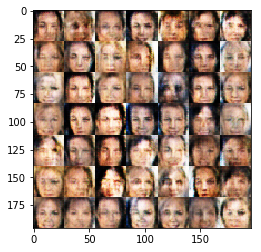

Epoch 1/1... Discriminator Loss: 1.4436... Generator Loss: 0.7954
Epoch 1/1... Discriminator Loss: 1.4396... Generator Loss: 0.4606
Epoch 1/1... Discriminator Loss: 1.3713... Generator Loss: 0.4427
Epoch 1/1... Discriminator Loss: 1.6579... Generator Loss: 0.3257
Epoch 1/1... Discriminator Loss: 1.3737... Generator Loss: 0.7178


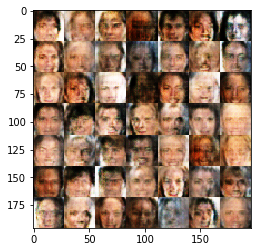

Epoch 1/1... Discriminator Loss: 1.6087... Generator Loss: 0.3314
Epoch 1/1... Discriminator Loss: 1.2981... Generator Loss: 0.6541
Epoch 1/1... Discriminator Loss: 1.3489... Generator Loss: 0.8038
Epoch 1/1... Discriminator Loss: 1.4360... Generator Loss: 0.4298
Epoch 1/1... Discriminator Loss: 1.3536... Generator Loss: 0.5309


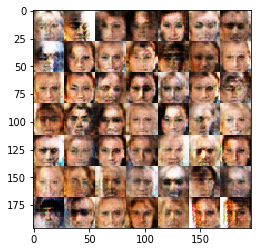

Epoch 1/1... Discriminator Loss: 1.3181... Generator Loss: 0.6892
Epoch 1/1... Discriminator Loss: 1.2460... Generator Loss: 0.9059
Epoch 1/1... Discriminator Loss: 1.5349... Generator Loss: 0.3626
Epoch 1/1... Discriminator Loss: 1.8148... Generator Loss: 0.2565
Epoch 1/1... Discriminator Loss: 1.2671... Generator Loss: 0.9043


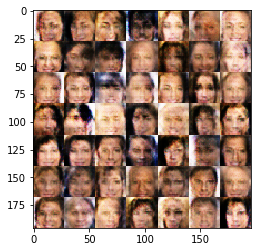

Epoch 1/1... Discriminator Loss: 1.1974... Generator Loss: 1.0150
Epoch 1/1... Discriminator Loss: 1.3417... Generator Loss: 0.5995
Epoch 1/1... Discriminator Loss: 1.2995... Generator Loss: 0.7917
Epoch 1/1... Discriminator Loss: 1.6272... Generator Loss: 0.3638
Epoch 1/1... Discriminator Loss: 1.3417... Generator Loss: 0.6372


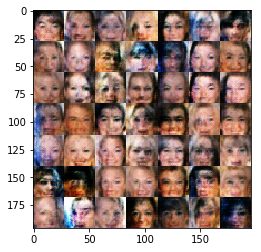

Epoch 1/1... Discriminator Loss: 1.2386... Generator Loss: 0.7067
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.8570
Epoch 1/1... Discriminator Loss: 1.2274... Generator Loss: 1.1345
Epoch 1/1... Discriminator Loss: 1.4276... Generator Loss: 1.3855
Epoch 1/1... Discriminator Loss: 1.3820... Generator Loss: 0.8434


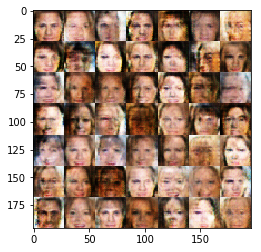

Epoch 1/1... Discriminator Loss: 1.7835... Generator Loss: 1.7872
Epoch 1/1... Discriminator Loss: 1.2930... Generator Loss: 0.7494
Epoch 1/1... Discriminator Loss: 1.3770... Generator Loss: 0.5911
Epoch 1/1... Discriminator Loss: 1.3364... Generator Loss: 0.8127
Epoch 1/1... Discriminator Loss: 1.3175... Generator Loss: 0.5335


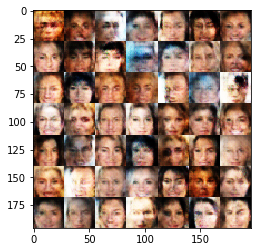

Epoch 1/1... Discriminator Loss: 1.2734... Generator Loss: 0.5704
Epoch 1/1... Discriminator Loss: 1.4411... Generator Loss: 0.5912
Epoch 1/1... Discriminator Loss: 1.3437... Generator Loss: 0.5533
Epoch 1/1... Discriminator Loss: 1.2750... Generator Loss: 0.6722
Epoch 1/1... Discriminator Loss: 1.6067... Generator Loss: 0.3480


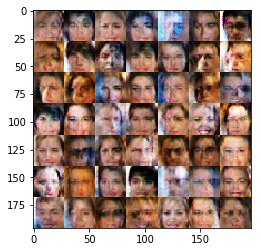

Epoch 1/1... Discriminator Loss: 1.2752... Generator Loss: 0.8831
Epoch 1/1... Discriminator Loss: 1.3287... Generator Loss: 0.5860
Epoch 1/1... Discriminator Loss: 1.5887... Generator Loss: 0.3954
Epoch 1/1... Discriminator Loss: 1.3354... Generator Loss: 1.0290
Epoch 1/1... Discriminator Loss: 1.3703... Generator Loss: 0.6727


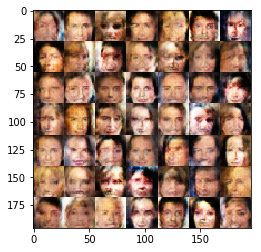

Epoch 1/1... Discriminator Loss: 1.6099... Generator Loss: 0.3960
Epoch 1/1... Discriminator Loss: 1.4388... Generator Loss: 0.4354
Epoch 1/1... Discriminator Loss: 1.3719... Generator Loss: 0.4923
Epoch 1/1... Discriminator Loss: 1.5425... Generator Loss: 0.4005
Epoch 1/1... Discriminator Loss: 1.3958... Generator Loss: 0.5151


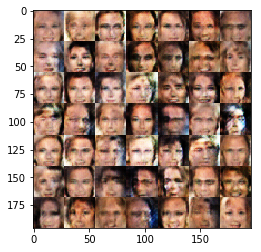

Epoch 1/1... Discriminator Loss: 1.3325... Generator Loss: 0.5955
Epoch 1/1... Discriminator Loss: 1.3756... Generator Loss: 0.6317
Epoch 1/1... Discriminator Loss: 1.2802... Generator Loss: 0.7761
Epoch 1/1... Discriminator Loss: 1.3707... Generator Loss: 0.6501
Epoch 1/1... Discriminator Loss: 1.4732... Generator Loss: 0.4479


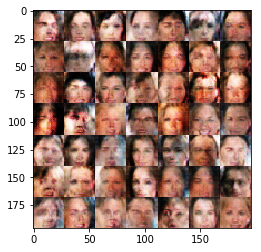

Epoch 1/1... Discriminator Loss: 1.2045... Generator Loss: 1.0011
Epoch 1/1... Discriminator Loss: 1.4008... Generator Loss: 0.6179
Epoch 1/1... Discriminator Loss: 1.2183... Generator Loss: 0.7540
Epoch 1/1... Discriminator Loss: 1.3607... Generator Loss: 0.9369
Epoch 1/1... Discriminator Loss: 1.3139... Generator Loss: 0.7005


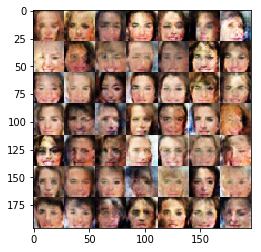

Epoch 1/1... Discriminator Loss: 1.3530... Generator Loss: 0.8380
Epoch 1/1... Discriminator Loss: 1.4377... Generator Loss: 0.4036
Epoch 1/1... Discriminator Loss: 1.2676... Generator Loss: 0.7256
Epoch 1/1... Discriminator Loss: 1.3538... Generator Loss: 0.5321
Epoch 1/1... Discriminator Loss: 1.3305... Generator Loss: 0.5327


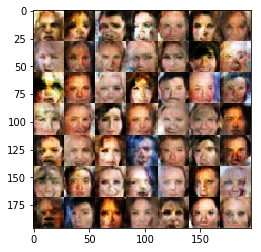

Epoch 1/1... Discriminator Loss: 1.2680... Generator Loss: 0.6643
Epoch 1/1... Discriminator Loss: 1.3384... Generator Loss: 0.7655
Epoch 1/1... Discriminator Loss: 1.1853... Generator Loss: 0.7582
Epoch 1/1... Discriminator Loss: 1.2697... Generator Loss: 0.7158
Epoch 1/1... Discriminator Loss: 1.2256... Generator Loss: 0.7828


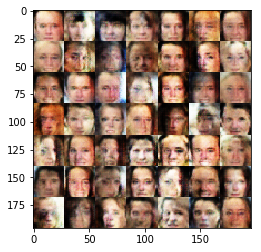

Epoch 1/1... Discriminator Loss: 1.3005... Generator Loss: 0.6275
Epoch 1/1... Discriminator Loss: 1.3455... Generator Loss: 1.0427
Epoch 1/1... Discriminator Loss: 1.3807... Generator Loss: 0.5207
Epoch 1/1... Discriminator Loss: 1.3038... Generator Loss: 0.6665
Epoch 1/1... Discriminator Loss: 1.5015... Generator Loss: 0.3948


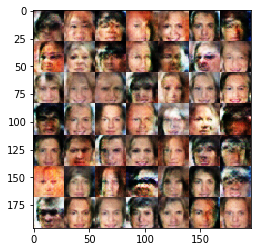

Epoch 1/1... Discriminator Loss: 1.1665... Generator Loss: 0.7768
Epoch 1/1... Discriminator Loss: 1.3591... Generator Loss: 0.6539
Epoch 1/1... Discriminator Loss: 1.2780... Generator Loss: 0.7039
Epoch 1/1... Discriminator Loss: 1.4373... Generator Loss: 0.4577
Epoch 1/1... Discriminator Loss: 1.4500... Generator Loss: 0.4222


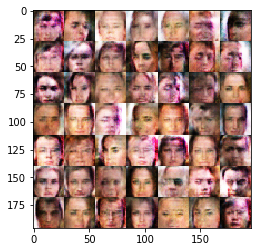

Epoch 1/1... Discriminator Loss: 1.1508... Generator Loss: 1.0301
Epoch 1/1... Discriminator Loss: 1.2576... Generator Loss: 0.5791
Epoch 1/1... Discriminator Loss: 1.3419... Generator Loss: 0.6571
Epoch 1/1... Discriminator Loss: 1.3959... Generator Loss: 1.3420
Epoch 1/1... Discriminator Loss: 1.3262... Generator Loss: 0.8074


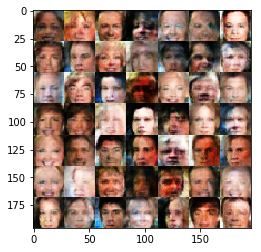

Epoch 1/1... Discriminator Loss: 1.4160... Generator Loss: 1.0300
Epoch 1/1... Discriminator Loss: 1.3735... Generator Loss: 1.0686
Epoch 1/1... Discriminator Loss: 1.3200... Generator Loss: 0.6054
Epoch 1/1... Discriminator Loss: 1.8472... Generator Loss: 0.2494
Epoch 1/1... Discriminator Loss: 1.1650... Generator Loss: 1.0424


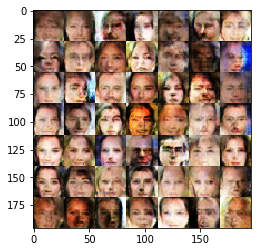

Epoch 1/1... Discriminator Loss: 1.2237... Generator Loss: 1.0112
Epoch 1/1... Discriminator Loss: 1.2448... Generator Loss: 0.7436
Epoch 1/1... Discriminator Loss: 1.4059... Generator Loss: 0.3916
Epoch 1/1... Discriminator Loss: 1.5196... Generator Loss: 0.3838
Epoch 1/1... Discriminator Loss: 1.4777... Generator Loss: 0.3848


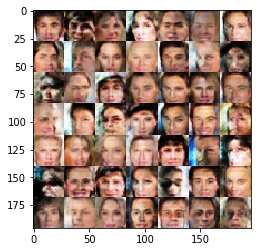

Epoch 1/1... Discriminator Loss: 1.4225... Generator Loss: 0.4694
Epoch 1/1... Discriminator Loss: 1.3628... Generator Loss: 0.5082
Epoch 1/1... Discriminator Loss: 1.5288... Generator Loss: 0.3902
Epoch 1/1... Discriminator Loss: 1.3034... Generator Loss: 1.1169
Epoch 1/1... Discriminator Loss: 1.3088... Generator Loss: 0.7835


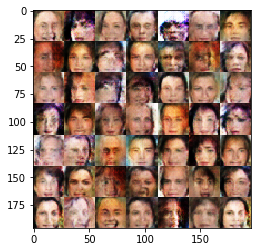

Epoch 1/1... Discriminator Loss: 1.4934... Generator Loss: 1.3240
Epoch 1/1... Discriminator Loss: 1.3005... Generator Loss: 0.5440
Epoch 1/1... Discriminator Loss: 1.4013... Generator Loss: 0.5171
Epoch 1/1... Discriminator Loss: 1.6044... Generator Loss: 0.3180
Epoch 1/1... Discriminator Loss: 1.2631... Generator Loss: 1.0758


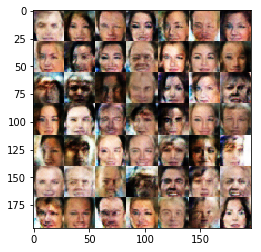

Epoch 1/1... Discriminator Loss: 1.3748... Generator Loss: 0.4517
Epoch 1/1... Discriminator Loss: 1.2975... Generator Loss: 0.5463
Epoch 1/1... Discriminator Loss: 1.1784... Generator Loss: 0.7868
Epoch 1/1... Discriminator Loss: 1.2539... Generator Loss: 0.7078
Epoch 1/1... Discriminator Loss: 1.2474... Generator Loss: 0.6596


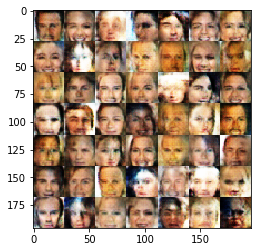

Epoch 1/1... Discriminator Loss: 1.4654... Generator Loss: 0.4816
Epoch 1/1... Discriminator Loss: 1.4009... Generator Loss: 0.4097
Epoch 1/1... Discriminator Loss: 1.3654... Generator Loss: 0.5260
Epoch 1/1... Discriminator Loss: 1.1971... Generator Loss: 1.0800
Epoch 1/1... Discriminator Loss: 1.2236... Generator Loss: 0.7957


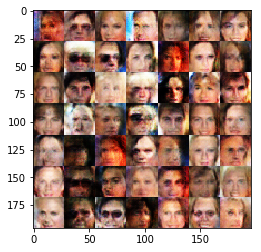

Epoch 1/1... Discriminator Loss: 1.2430... Generator Loss: 1.0662
Epoch 1/1... Discriminator Loss: 1.2347... Generator Loss: 0.7473
Epoch 1/1... Discriminator Loss: 1.6988... Generator Loss: 0.2955
Epoch 1/1... Discriminator Loss: 1.3039... Generator Loss: 0.5152
Epoch 1/1... Discriminator Loss: 1.6013... Generator Loss: 0.3248


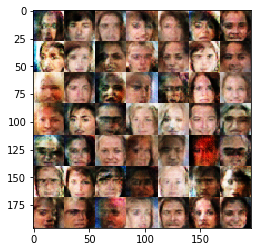

Epoch 1/1... Discriminator Loss: 1.3858... Generator Loss: 0.4846
Epoch 1/1... Discriminator Loss: 1.3996... Generator Loss: 0.4577
Epoch 1/1... Discriminator Loss: 1.2433... Generator Loss: 0.6278
Epoch 1/1... Discriminator Loss: 1.4216... Generator Loss: 0.5182
Epoch 1/1... Discriminator Loss: 1.2571... Generator Loss: 0.6170


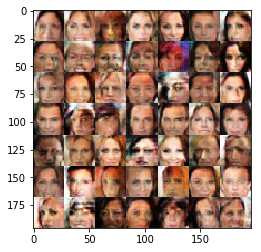

Epoch 1/1... Discriminator Loss: 1.2848... Generator Loss: 0.7477
Epoch 1/1... Discriminator Loss: 1.3414... Generator Loss: 0.5553
Epoch 1/1... Discriminator Loss: 1.2703... Generator Loss: 0.8440
Epoch 1/1... Discriminator Loss: 1.3173... Generator Loss: 0.7419
Epoch 1/1... Discriminator Loss: 1.3113... Generator Loss: 1.0447


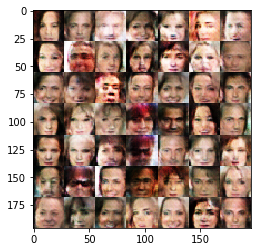

Epoch 1/1... Discriminator Loss: 1.3801... Generator Loss: 1.3057
Epoch 1/1... Discriminator Loss: 1.3299... Generator Loss: 0.7533
Epoch 1/1... Discriminator Loss: 1.2501... Generator Loss: 0.7346
Epoch 1/1... Discriminator Loss: 1.3871... Generator Loss: 0.4629
Epoch 1/1... Discriminator Loss: 1.4093... Generator Loss: 0.4584


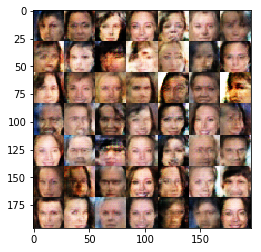

Epoch 1/1... Discriminator Loss: 1.5481... Generator Loss: 0.3864
Epoch 1/1... Discriminator Loss: 1.2854... Generator Loss: 0.7474
Epoch 1/1... Discriminator Loss: 1.3739... Generator Loss: 1.4285
Epoch 1/1... Discriminator Loss: 1.2570... Generator Loss: 0.5553
Epoch 1/1... Discriminator Loss: 1.3056... Generator Loss: 0.7968


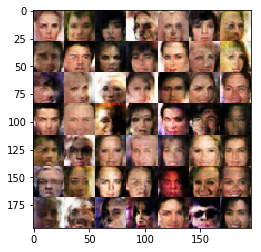

Epoch 1/1... Discriminator Loss: 1.1801... Generator Loss: 1.0687
Epoch 1/1... Discriminator Loss: 1.2524... Generator Loss: 0.6236
Epoch 1/1... Discriminator Loss: 1.3606... Generator Loss: 0.5997
Epoch 1/1... Discriminator Loss: 1.3303... Generator Loss: 0.4580
Epoch 1/1... Discriminator Loss: 1.4959... Generator Loss: 0.4204


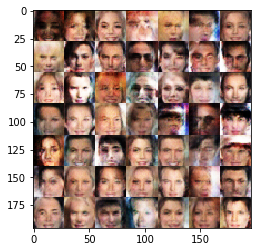

Epoch 1/1... Discriminator Loss: 1.4109... Generator Loss: 0.4664
Epoch 1/1... Discriminator Loss: 1.3302... Generator Loss: 1.3380
Epoch 1/1... Discriminator Loss: 1.3678... Generator Loss: 0.6114
Epoch 1/1... Discriminator Loss: 1.2331... Generator Loss: 0.9386
Epoch 1/1... Discriminator Loss: 1.3552... Generator Loss: 0.4830


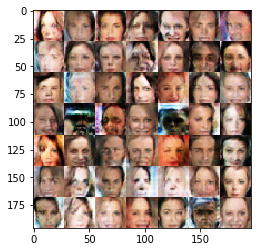

Epoch 1/1... Discriminator Loss: 1.1994... Generator Loss: 0.8547
Epoch 1/1... Discriminator Loss: 1.3816... Generator Loss: 1.0029
Epoch 1/1... Discriminator Loss: 1.5532... Generator Loss: 0.4265
Epoch 1/1... Discriminator Loss: 1.4918... Generator Loss: 0.4571
Epoch 1/1... Discriminator Loss: 1.5738... Generator Loss: 0.4067


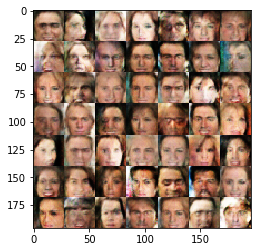

Epoch 1/1... Discriminator Loss: 1.3988... Generator Loss: 1.2097
Epoch 1/1... Discriminator Loss: 1.2719... Generator Loss: 0.7131
Epoch 1/1... Discriminator Loss: 1.4139... Generator Loss: 0.4419
Epoch 1/1... Discriminator Loss: 1.5235... Generator Loss: 0.3518
Epoch 1/1... Discriminator Loss: 1.3322... Generator Loss: 0.7495


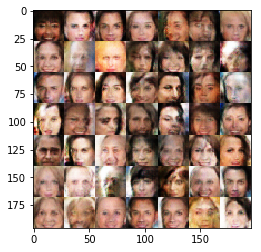

Epoch 1/1... Discriminator Loss: 1.2262... Generator Loss: 0.9986
Epoch 1/1... Discriminator Loss: 1.4233... Generator Loss: 0.4298
Epoch 1/1... Discriminator Loss: 1.3960... Generator Loss: 1.2906
Epoch 1/1... Discriminator Loss: 1.2530... Generator Loss: 0.9156
Epoch 1/1... Discriminator Loss: 1.4551... Generator Loss: 1.0894


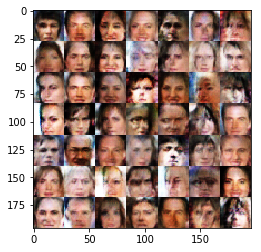

Epoch 1/1... Discriminator Loss: 1.2628... Generator Loss: 0.7432
Epoch 1/1... Discriminator Loss: 1.2911... Generator Loss: 0.7719
Final : Discriminator Loss: 1.2911... Generator Loss: 0.7719


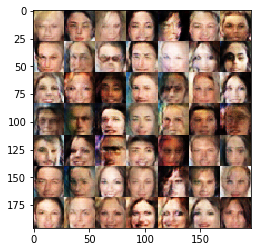

In [81]:
batch_size = 64
z_dim = 100
learning_rate = 0.002
beta1 = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.